In [17]:
import random
import os
import cv2
from matplotlib import pyplot as plt
import albumentations as A
%matplotlib inline

In [18]:
image_dir = '../data_lacmus/TrainingData/JPEGImages'
split_dir = '../data_lacmus/TrainingData/ImageSets/Main'
xml_dir = '../data_lacmus/TrainingData/Annotations'

In [19]:
splits = ['train', 'train_non_empty', 'trainval', 'val', 'test', 'valtest']

In [20]:
split2filenames = {}
for split in splits:
    with open(f'{split_dir}/{split}.txt', 'r') as f:
        for line in f:
            if split in split2filenames:
                split2filenames[split].append(line.strip())
            else:
                split2filenames[split] = [line.strip()]

In [21]:
import xml.etree.ElementTree as ET
import collections

def parse_voc_xml(node):
    voc_dict = {}
    children = list(node)
    if children:
        def_dic = collections.defaultdict(list)
        for dc in map(parse_voc_xml, children):
            for ind, v in dc.items():
                def_dic[ind].append(v)
        if node.tag == 'annotation':
            def_dic['object'] = [def_dic['object']]
        voc_dict = {
            node.tag:
                {ind: v[0] if len(v) == 1 else v
                 for ind, v in def_dic.items()}
        }
    if node.text:
        text = node.text.strip()
        if not children:
            voc_dict[node.tag] = text
    return voc_dict

def read_xml(xml_filename):
    description = parse_voc_xml(ET.parse(xml_filename).getroot())

    # get bounding box coordinates 
    num_objs = len(description['annotation']['object'])
    boxes = []
    for l in description['annotation']['object']:
        bb = l['bndbox']
        boxes.append([int(bb['xmin']), 
                      int(bb['ymin']), 
                      int(bb['xmax']), 
                      int(bb['ymax'])])
        
    return boxes

In [66]:
BOX_COLOR = (255, 0, 0) # Red

def visualize_bbox(img, bbox, color=BOX_COLOR, thickness=2):
    x_min, y_min, x_max, y_max = bbox
    x_min = int(x_min)
    y_min = int(y_min)
    x_max = int(x_max)
    y_max = int(y_max)
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)

    return img

In [67]:
def visualize(image, bboxes):
    img = image.copy()
    for bbox in bboxes:
        img = visualize_bbox(img, bbox)
    plt.figure(figsize=(20, 12), dpi=150)
    # plt.axis('off')
    plt.imshow(img)

In [110]:
def show_image(split):
    filenames = split2filenames[split]
    filename = filenames[random.randint(0, len(filenames))]
    filename = 821
    print(filename)


    
    image = cv2.imread(f'{image_dir}/{filename}.jpg')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    print(image.shape)
    
    xml_filename = f'{xml_dir}/{filename}.xml'
    if os.path.exists(xml_filename):
        bboxes = read_xml(xml_filename)
        visualize(image, bboxes)

47
(3000, 4000, 3)


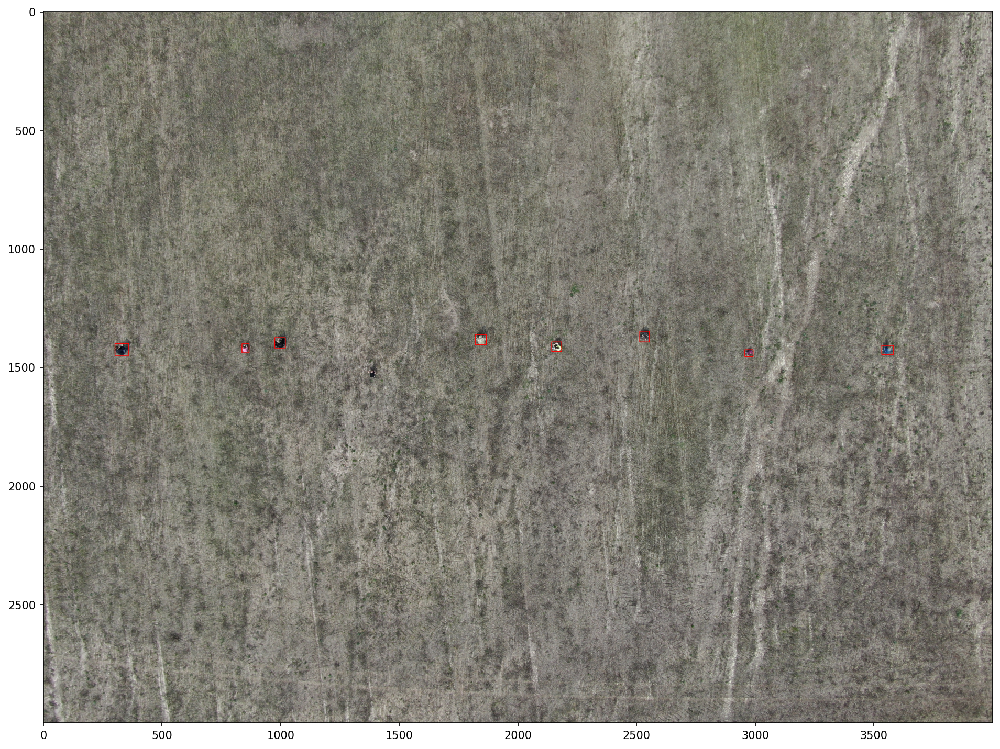

In [111]:
split = 'valtest'
show_image(split)

In [109]:
transform_r = A.Compose([
    A.Resize(width=4000, height=3000),
    #A.HorizontalFlip(p=0.5),
    #A.RandomBrightnessContrast(p=0.2),
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['class_labels']))

In [112]:
random.seed(7)
def show_transformed(split):
    filenames = split2filenames[split]
    filename = filenames[random.randint(0, len(filenames))]
    filename = 821
    print(filename)
    
    image = cv2.imread(f'{image_dir}/{filename}.jpg')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    xml_filename = f'{xml_dir}/{filename}.xml'
    if os.path.exists(xml_filename):
        bboxes = read_xml(xml_filename)
        class_labels = ['person'] * len(bboxes)
        transformed = transform(image=image, bboxes=bboxes, class_labels=class_labels)
        show_image(split)
        visualize(transformed['image'], transformed['bboxes'])
        #transformed_r = transform_r(image=transformed['image'], bboxes=transformed['bboxes'], class_labels=class_labels)
        #visualize(transformed_r['image'], transformed_r['bboxes'])

821
718
(3000, 4000, 3)


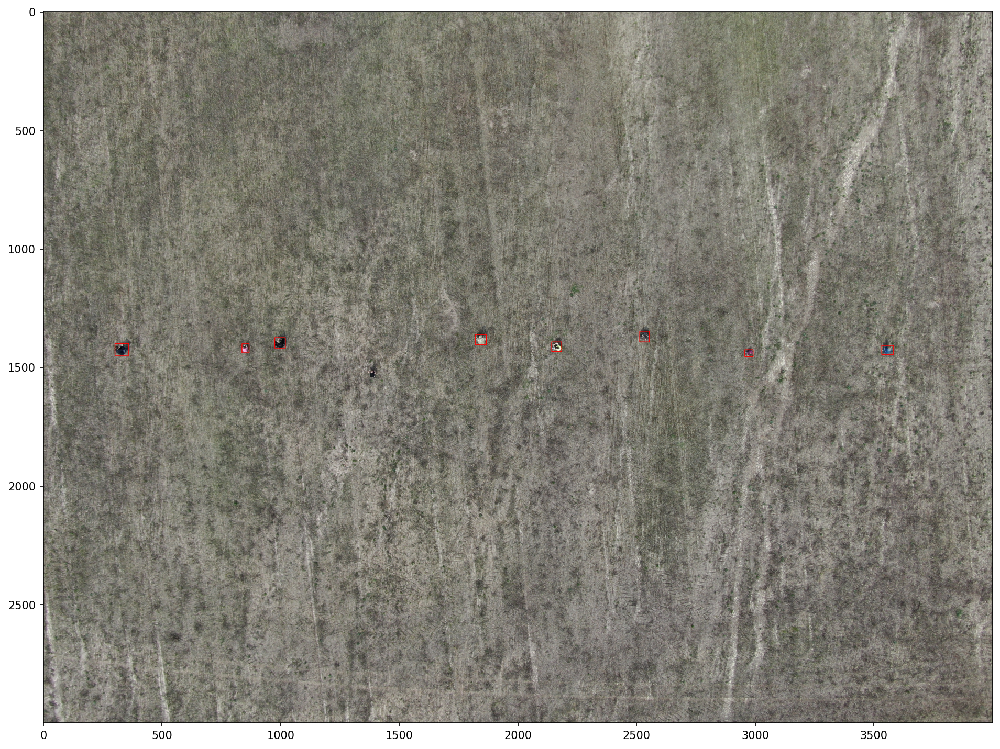

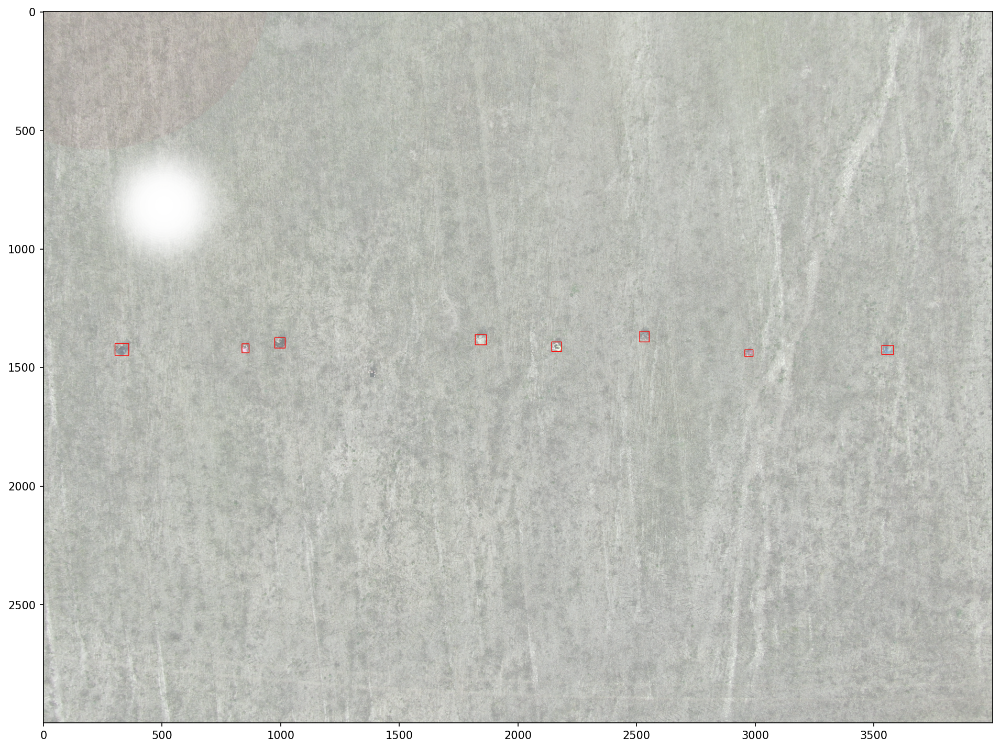

In [126]:
split = 'valtest'
transform = A.Compose([
    A.RandomSunFlare(flare_roi=(0, 0, 1, 0.5), angle_lower=0.5, p=0.3),
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['class_labels']))

show_transformed(split)